In [1]:
import pandas as pd
from sklearn import decomposition, datasets
%matplotlib inline
import pandas as pd 
import numpy as np  
from sklearn.decomposition import PCA 
import matplotlib.pyplot as plt 
import ruptures as rpt

In [2]:
df = pd.read_csv(r'C:\Users\PC\Cookies\Desktop\spinewise project\059-COMBINED-2022-11-7-13-2-45-1667849080-v1.4.3+lucina-buzz.csv')

In [3]:
df.columns

Index(['Unnamed: 0', 'ts_r', 'acc_x_r', 'acc_y_r', 'acc_z_r', 'temp_r',
       'gyr_x_r', 'gyr_y_r', 'gyr_z_r', 'mag_x_r', 'mag_y_r', 'mag_z_r',
       'kal_status_r', 'alpha_r', 'beta_r', 'ts_n', 'acc_x_n', 'acc_y_n',
       'acc_z_n', 'temp_n', 'gyr_x_n', 'gyr_y_n', 'gyr_z_n', 'mag_x_n',
       'mag_y_n', 'mag_z_n', 'kal_status_n', 'alpha_n', 'beta_n'],
      dtype='object')

In [4]:
df['difference'] = df['beta_r'] - df['alpha_r']

In [5]:
df.head()

,Unnamed: 0,ts_r,acc_x_r,acc_y_r,acc_z_r,temp_r,gyr_x_r,gyr_y_r,gyr_z_r,mag_x_r,...,gyr_x_n,gyr_y_n,gyr_z_n,mag_x_n,mag_y_n,mag_z_n,kal_status_n,alpha_n,beta_n,difference
0,0,77028.0,0.976074,-0.250977,-0.122070,3952.0,-0.640869,1.556396,-0.213623,-6.0,...,-1.892090,0.091553,0.366211,6248.0,-6246.0,-10420.0,0.0,-705.0,1792.0,0.0
1,1,77029.0,0.973145,-0.246826,-0.119873,3936.0,-0.457764,1.464844,0.061035,-6.0,...,-1.617432,0.061035,0.488281,6237.0,-6316.0,-10856.0,0.0,-705.0,1792.0,0.0
2,2,77030.0,0.976562,-0.247559,-0.127441,4080.0,-0.091553,1.556396,0.152588,11144.0,...,-1.708984,-0.244141,0.946045,6237.0,-6316.0,-10856.0,0.0,-705.0,1792.0,0.0
3,3,77031.0,0.973633,-0.248291,-0.121582,3968.0,0.305176,1.586914,0.030518,11144.0,...,-1.617432,-0.030518,0.518799,6237.0,-6243.0,-10409.0,0.0,-705.0,1792.0,0.0
4,4,77032.0,0.973145,-0.251221,-0.125244,3968.0,-0.244141,1.495361,-0.274658,11139.0,...,-1.342773,-0.335693,0.427246,6237.0,-6243.0,-10409.0,0.0,-705.0,1792.0,0.0


In [6]:
df = df.drop(['gyr_x_n','gyr_y_n', 'gyr_z_n','gyr_x_n','acc_x_n','acc_y_n','acc_z_n','gyr_y_n', 'gyr_z_n','kal_status_n','temp_r','alpha_r','beta_r','alpha_n','beta_n','Unnamed: 0','mag_z_n','mag_y_n','mag_x_r','mag_y_r','mag_z_r','temp_n','mag_x_n','kal_status_r','ts_n'], axis=1)

In [7]:
df.head()

,ts_r,acc_x_r,acc_y_r,acc_z_r,gyr_x_r,gyr_y_r,gyr_z_r,difference
0,77028.0,0.976074,-0.250977,-0.122070,-0.640869,1.556396,-0.213623,0.0
1,77029.0,0.973145,-0.246826,-0.119873,-0.457764,1.464844,0.061035,0.0
2,77030.0,0.976562,-0.247559,-0.127441,-0.091553,1.556396,0.152588,0.0
3,77031.0,0.973633,-0.248291,-0.121582,0.305176,1.586914,0.030518,0.0
4,77032.0,0.973145,-0.251221,-0.125244,-0.244141,1.495361,-0.274658,0.0


In [8]:
from sklearn.preprocessing import MinMaxScaler


x_calls = df.columns[1:]
scaller = MinMaxScaler()
matrix = pd.DataFrame(scaller.fit_transform(df[x_calls]),columns=x_calls)
matrix['ts'] = df['ts_r']

print(matrix.head())

    acc_x_r   acc_y_r   acc_z_r   gyr_x_r   gyr_y_r   gyr_z_r  difference  \
0  0.684081  0.437263  0.469490  0.481186  0.387054  0.648933    0.396321   
1  0.683177  0.438300  0.470039  0.481281  0.386998  0.649245    0.396321   
2  0.684231  0.438117  0.468147  0.481471  0.387054  0.649349    0.396321   
3  0.683327  0.437934  0.469612  0.481677  0.387073  0.649210    0.396321   
4  0.683177  0.437201  0.468696  0.481392  0.387016  0.648864    0.396321   

        ts  
0  77028.0  
1  77029.0  
2  77030.0  
3  77031.0  
4  77032.0  


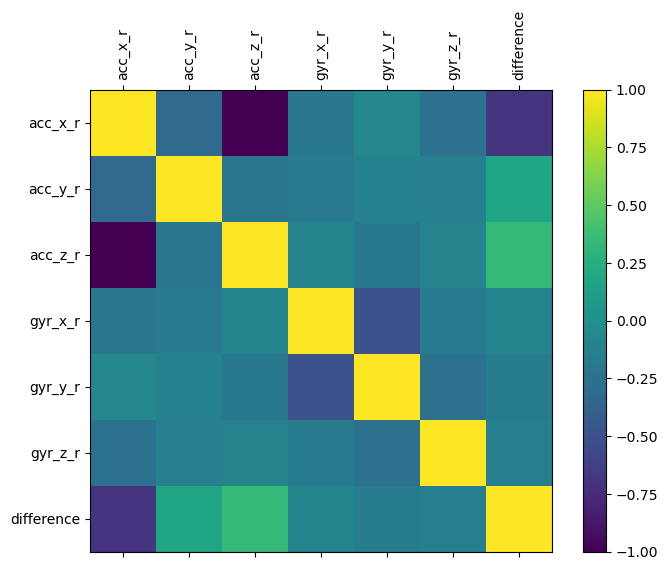

In [9]:
corr = matrix[x_calls].corr()
fig, ax = plt.subplots(figsize=(8, 6))
cax=ax.matshow(corr,vmin=-1,vmax=1)
ax.matshow(corr)
plt.xticks(range(len(corr.columns)), corr.columns)
plt.yticks(range(len(corr.columns)), corr.columns)
plt.xticks(rotation=90)
plt.colorbar(cax)

In [10]:
# Reduction dimention of the data using PCA
pca = PCA(n_components=3)
matrix['x'] = pca.fit_transform(matrix[x_calls])[:,0]
matrix['y'] = pca.fit_transform(matrix[x_calls])[:,1]
matrix['z'] = pca.fit_transform(matrix[x_calls])[:,2]

In [11]:
matrix.head()

,acc_x_r,acc_y_r,acc_z_r,gyr_x_r,gyr_y_r,gyr_z_r,difference,ts,x,y,z
0,0.684081,0.437263,0.469490,0.481186,0.387054,0.648933,0.396321,77028.0,-0.063594,0.029183,-0.019481
1,0.683177,0.438300,0.470039,0.481281,0.386998,0.649245,0.396321,77029.0,-0.062625,0.029275,-0.018415
2,0.684231,0.438117,0.468147,0.481471,0.387054,0.649349,0.396321,77030.0,-0.064355,0.028237,-0.018536
3,0.683327,0.437934,0.469612,0.481677,0.387073,0.649210,0.396321,77031.0,-0.062983,0.029199,-0.018664
4,0.683177,0.437201,0.468696,0.481392,0.387016,0.648864,0.396321,77032.0,-0.063450,0.029159,-0.018945


In [12]:
matrix = matrix.drop(['acc_x_r','acc_y_r','acc_z_r','gyr_x_r','gyr_y_r','gyr_z_r','difference'], axis = 1)

In [13]:
matrix.head()

,ts,x,y,z
0,77028.0,-0.063594,0.029183,-0.019481
1,77029.0,-0.062625,0.029275,-0.018415
2,77030.0,-0.064355,0.028237,-0.018536
3,77031.0,-0.062983,0.029199,-0.018664
4,77032.0,-0.063450,0.029159,-0.018945


In [14]:
x_calls = matrix.columns[1:]

In [15]:
matrix = matrix.rolling(window=5, min_periods=1).mean()
print(matrix)

              ts         x         y         z
0        77028.0 -0.063594  0.029183 -0.019481
1        77028.5 -0.063109  0.029229 -0.018948
2        77029.0 -0.063524  0.028898 -0.018810
3        77029.5 -0.063389  0.028973 -0.018774
4        77030.0 -0.063401  0.029010 -0.018808
...          ...       ...       ...       ...
176911  253937.0 -0.064082 -0.005436  0.007709
176912  253938.0 -0.063211 -0.004101  0.004910
176913  253939.0 -0.066571 -0.005858  0.001763
176914  253940.0 -0.068675 -0.005783 -0.003179
176915  253941.0 -0.070154 -0.008132 -0.000878

[176916 rows x 4 columns]


In [16]:
def plot_BIC(matrix,df_result,K):
    from sklearn import mixture
    BIC=[]
    for k in K:
        model=mixture.GaussianMixture(n_components=k,init_params='kmeans')
        model.fit(matrix[x_calls])
        BIC.append(model.bic(matrix[x_calls]))
    fig, ax = plt.subplots(figsize=(8, 6))
    plt.plot(K,BIC,'-cx')
    plt.ylabel("BIC score")
    plt.xlabel("k")
    plt.title("BIC scoring for K-means cell's behaviour")
    return(BIC)

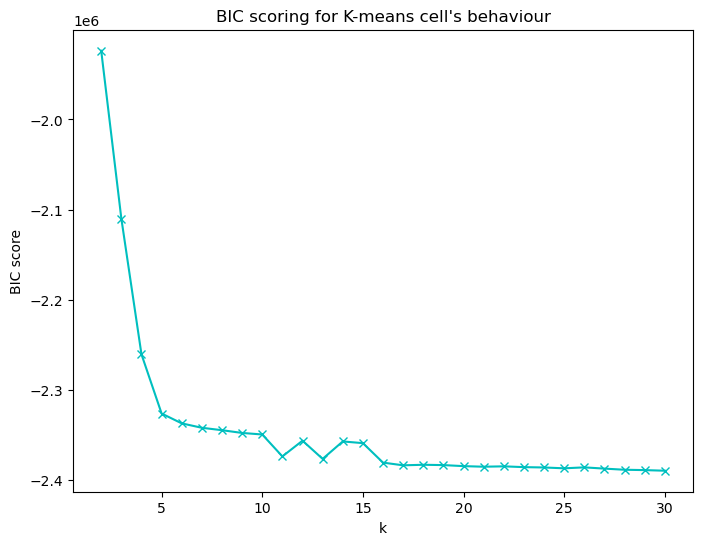

In [17]:
K = range(2,31)
BIC = plot_BIC(matrix,x_calls,K)

In [18]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
cluster = KMeans(n_clusters=5,random_state=217)
matrix['cluster'] = cluster.fit_predict(matrix[x_calls])
print(matrix.cluster.value_counts())

0    138177
3     19970
2      8972
4      5297
1      4500
Name: cluster, dtype: int64


Text(0.5, 1.0, 'Cluster of Data')

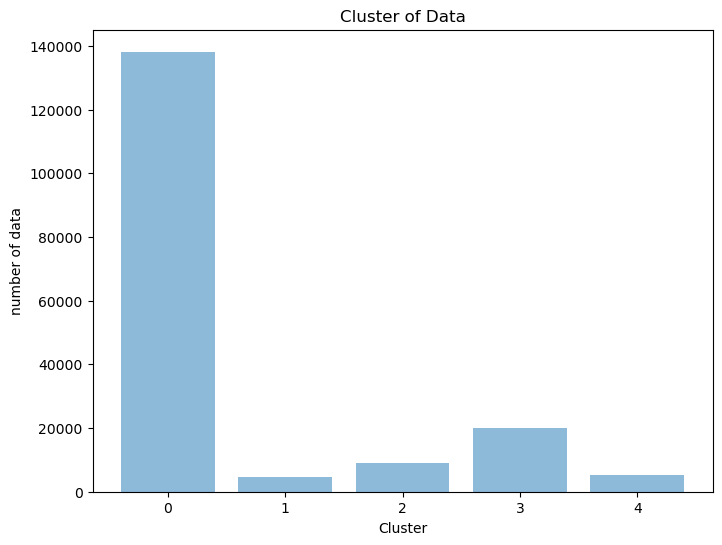

In [19]:
d=pd.DataFrame(matrix.cluster.value_counts())
fig, ax = plt.subplots(figsize=(8, 6))
plt.bar(d.index,d['cluster'],align='center',alpha=0.5)
plt.xlabel('Cluster')
plt.ylabel('number of data')
plt.title('Cluster of Data')

In [20]:
from sklearn.metrics.pairwise import euclidean_distances
distance = euclidean_distances(cluster.cluster_centers_, cluster.cluster_centers_)
print(distance)

[[0.         0.4283983  0.59889173 0.18104894 0.43143576]
 [0.4283983  0.         0.32194882 0.44143445 0.26667837]
 [0.59889173 0.32194882 0.         0.55790465 0.58847723]
 [0.18104894 0.44143445 0.55790465 0.         0.49746697]
 [0.43143576 0.26667837 0.58847723 0.49746697 0.        ]]


In [21]:
cluster.cluster_centers_

array([[-0.05336582,  0.01074202, -0.01351775],
       [ 0.3585357 ,  0.11840461,  0.03413737],
       [ 0.52413772, -0.1280234 , -0.09036263],
       [-0.00326317, -0.12789892,  0.0915876 ],
       [ 0.21176702,  0.31897473,  0.1308221 ]])

In [22]:
matrix.head()

,ts,x,y,z,cluster
0,77028.0,-0.063594,0.029183,-0.019481,0
1,77028.5,-0.063109,0.029229,-0.018948,0
2,77029.0,-0.063524,0.028898,-0.018810,0
3,77029.5,-0.063389,0.028973,-0.018774,0
4,77030.0,-0.063401,0.029010,-0.018808,0


In [23]:
cluster.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [24]:
#!pip install plotly
import plotly.express as px
px.scatter(matrix, x='ts', y='x', color='cluster')